> Projeto Desenvolve <br>
Programação Intermediária com Python <br>
Profa. Camila Laranjeira (mila@projetodesenvolve.com.br) <br>

# 4.2 - APIs


## Exercícios 🔭🌌🪐

Vamos acessar as APIs da NASA para ver algumas imagens interessantes capturadas universo afora!

#### Q1.
Crie uma chave no site oficial:
* https://api.nasa.gov

Vamos armazenar a chave de forma segura! <br>
Salve a sua chave em um arquivo `key.json` na forma:
`API_KEY=SUA_CHAVE`

Adicione o nome do arquivo `key.json` ao `.gitignore` do repositório que você fará upload da atividade.
Para isso basta abrir o arquivo `.gitignore` na pasta raíz do repositório (ou criar um caso ele não exista). Dentro do arquivo, apenas adiciona o nome do arquivo que deseja ignorar.

#### Q2. 🛰 Astronomy Picture of the Day (APOD) 🌌
> Antes de fazer os exercícios, devo te lembrar que existem limites de acesso às APIs, descritas na página principal, portanto pega leve na tentativa e erro na hora de testar seu código.

<img width=500 src=https://apod.nasa.gov/apod/image/2407/M24-HaLRGB-RC51_1024.jpg>

A primeira API que acessaremos é a mais popular de todas: astronomy picture of the day (foto astronômica do dia).

Faça uma requisição GET para a URL da API que retorna a imagem do dia! Essa é fácil já que são os valores padrão da rota principal:
* URL base: `'https://api.nasa.gov/planetary/apod'`
* Endpoint: não precisa preencher, acessaremos a raíz da API.
* Query params: preencha `api_key` com a sua chave de autenticação. Se animar mexer em outros parâmetros veja [a documentação](https://api.nasa.gov).

Ao receber a resposta (um json), você deve:
* Imprimir os campos `copyright` e `explanation`
* Com as biblioteca scikit-images e matplotlib, apresente a imagem a partir do campo `url` ou `hdurl`, e preencha o título do plot com o campo `title` do json. Uma dica de código a seguir.
```python
from skimage import io
img = io.imread(url)
## plot a matriz img com matplotlib (imshow)
```   

Copyright: 
Francis Bozon & Cecil Navick
(AstroA. R. O.)

Explanation: This cosmic skyscape features glowing gas and dark dust clouds alongside the young stars of NGC 3572.  A beautiful emission nebula and star cluster, it sails far southern skies within the nautical constellation Carina.  Stars from NGC 3572 are toward top center in the telescopic frame that would measure about 100 light-years across at the cluster's estimated distance of 9,000 light-years.  The visible interstellar gas and dust, shown in colors of the Hubble palette, is part of the star cluster's natal molecular cloud, itself cataloged as Gum 37. Dense streamers of material within the nebula, eroded by stellar winds and radiation, clearly trail away from the energetic young stars.  They are likely sites of ongoing star formation with shapes reminiscent of the Tadpoles of IC 410 -- better known to northern skygazers.  In the coming tens to hundreds of millions of years, gas and stars in the cluster will be dispersed t

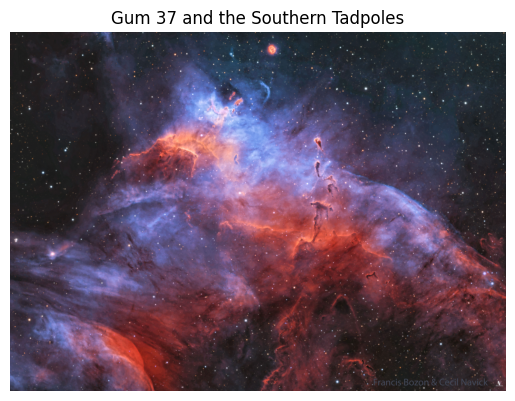

In [1]:
import json
import requests
from skimage import io
import matplotlib.pyplot as plt

# Carregar a chave da API a partir do arquivo key.json
with open("key.json", "r") as f:
    data = json.load(f)
    api_key = data["API_KEY"]

# Fazer a requisição GET para a API APOD
url = "https://api.nasa.gov/planetary/apod"
params = {"api_key": api_key}
response = requests.get(url, params=params)

# Verificar se a requisição foi bem-sucedida
if response.status_code == 200:
    apod_data = response.json()
    
    # Imprimir os campos 'copyright' e 'explanation'
    print("Copyright:", apod_data.get("copyright", "N/A"))
    print("Explanation:", apod_data["explanation"])
    
    # Obter a URL da imagem
    img_url = apod_data.get("hdurl") or apod_data.get("url")
    title = apod_data["title"]
    
    # Carregar e exibir a imagem com matplotlib
    img = io.imread(img_url)
    plt.imshow(img)
    plt.axis("off")
    plt.title(title)
    plt.show()
else:
    print(f"Erro na requisição: {response.status_code}")

#### Q3. Limites
A partir da resposta da query anterios, imprima o header da resposta e consulte os atributos:
* X-RateLimit-Limit: o limite total de requisições da sua chave de API
* X-RateLimit-Remaining: o limite restante de requisições da sua chave de API

In [2]:
import requests
import json

# Carregar a chave da API a partir do arquivo key.json
with open("key.json", "r") as f:
    data = json.load(f)
    api_key = data["API_KEY"]

# Fazer a requisição GET para a API APOD
url = "https://api.nasa.gov/planetary/apod"
params = {"api_key": api_key}
response = requests.get(url, params=params)

# Verificar se a requisição foi bem-sucedida
if response.status_code == 200:
    # Exibir todos os cabeçalhos da resposta
    print("Headers da Resposta:")
    for key, value in response.headers.items():
        print(f"{key}: {value}")
    
    # Consultar os atributos de limite de requisições
    rate_limit = response.headers.get("X-RateLimit-Limit", "N/A")
    rate_remaining = response.headers.get("X-RateLimit-Remaining", "N/A")
    print("\nLimites de Requisição:")
    print(f"X-RateLimit-Limit: {rate_limit}")
    print(f"X-RateLimit-Remaining: {rate_remaining}")
else:
    print(f"Erro na requisição: {response.status_code}")

Headers da Resposta:
Date: Mon, 28 Apr 2025 14:17:42 GMT
Content-Type: application/json
Transfer-Encoding: chunked
Connection: keep-alive
Access-Control-Allow-Origin: *
Access-Control-Expose-Headers: X-RateLimit-Limit, X-RateLimit-Remaining
Age: 0
Content-Encoding: gzip
Strict-Transport-Security: max-age=31536000; includeSubDomains; preload
Vary: Accept-Encoding
Via: https/1.1 api-umbrella (ApacheTrafficServer [cMsSf ])
X-Api-Umbrella-Request-Id: cmfj1ch9r02f1q2q6obg
X-Cache: MISS
X-Content-Type-Options: nosniff
X-Ratelimit-Limit: 2000
X-Ratelimit-Remaining: 1997
X-Vcap-Request-Id: 93aab08d-7066-4557-50d6-c32f808372f8
X-Xss-Protection: 1; mode=block
X-Frame-Options: DENY

Limites de Requisição:
X-RateLimit-Limit: 2000
X-RateLimit-Remaining: 1997


### Q4. Mars Rover Photos 🚀🚙 📷

<img width=500 src=https://www.nasa.gov/wp-content/uploads/2019/10/pia23378-16.jpg>

Essa API retorna dados (incluindo imagens capturadas) sobre os veículos que hoje habitam o planeta Marte. São os rovers `opportunity`, `spirit` e o mais famoso, o `curiosity` (da foto acima).

Antes de requisitar imagens, vamos ver o relatório de dados coletados por um deles, o `curiosity`. Isso vai nos ajudar a montar a query de imagens coletadas.

Faça uma requisição GET para a seguinte URL:
* URL base: `'https://api.nasa.gov/mars-photos/api/v1'`
* endpoint: `'/manifests/{nome_do_rover}'`
* query parameters: preencha `api_key` com a sua chave de autenticação.

Extraia o json da resposta retornada. O campo principal é o `'photo_manifest'`, do qual queremos acessar os seguintes valores:
* `max_sol`: Máximo "dia marciano" de coleta de fotos. O dia marciano tem 24 horas, 39 minutos e 35 segundos.
* `max_date`: Última data terrestre de coleta de fotos, na forma `'aaaa-mm-dd'`.

Imprima esses dois atributos da resposta e os use no próximo exercício para coletar as fotos mais recentes tiradas. 

In [3]:
import requests
import json

# Carregar a chave da API a partir do arquivo key.json
with open("key.json", "r") as f:
    data = json.load(f)
    api_key = data["API_KEY"]

# Fazer a requisição GET para o endpoint de manifestos
url = "https://api.nasa.gov/mars-photos/api/v1/manifests/curiosity"
params = {"api_key": api_key}
response = requests.get(url, params=params)

# Verificar se a requisição foi bem-sucedida
if response.status_code == 200:
    # Carregar o JSON da resposta
    manifest_data = response.json()
    photo_manifest = manifest_data.get("photo_manifest", {})

    # Extrair os valores desejados
    max_sol = photo_manifest.get("max_sol", "N/A")  # Máximo "dia marciano"
    max_date = photo_manifest.get("max_date", "N/A")  # Última data terrestre

    # Imprimir os valores extraídos
    print(f"Máximo Sol (dia marciano): {max_sol}")
    print(f"Última data terrestre de coleta: {max_date}")
else:
    print(f"Erro na requisição: {response.status_code}")

Máximo Sol (dia marciano): 4523
Última data terrestre de coleta: 2025-04-27


#### Q5.

Faça uma requisição GET para a URL da API que retorna links para as imagens coletadas pelos rovers.

* URL base: `'https://api.nasa.gov/mars-photos/api/v1'`
* Endpoint: `/rovers/{nome_do_rover}/photos`
* Query params sugeridos: 
    * `api_key`: sua chave de autenticação.
    * `sol`: dia marciano que deseja coletar (de 0 a `max_sol` coletado anteriormente)
    * `page`: você pode paginar entre as respostas! São retornados 25 resultados por página.

A resposta esperada estará no formato a seguir, uma lista no campo `'photos'` onde cada item é um dicionário com os dados da foto tirada. Dentre os dados há o campo `camera` indicando qual das câmeras do rover tirou a foto. As fotos mais interessantes (na minha opinião, claro) são das câmeras de navegação (`"name": "NAVCAM"`) e as de prevenção de colisão (frente: `"name": "FHAZ"` e trás `"name": "RHAZ"`) onde dá pra ver partes do robô!

**Seu trabalho é**:
* Paginar a requisição acima até que a resposta seja `None`
* Escolher uma ou mais câmeras (ex: `NAVCAM`, `FHAZ`, `RHAZ`), e em um laço de repetição plotar todas as imagens retornadas daquela câmera. Use novamente as bibliotecas scikit-image e matplotlib. 
  * O título da imagem deve ter a página da requisição, nome da câmera e id da imagem.

```json
{
  "photos": [
    {
      "id": 1228212,
      "sol": 4102,
      "camera": {
        "id": 20,
        "name": "FHAZ",
        "rover_id": 5,
        "full_name": "Front Hazard Avoidance Camera"
      },
      "img_src": "https://mars.nasa.gov/msl-raw-images/proj/msl/redops/ods/surface/sol/04102/opgs/edr/fcam/FLB_761645828EDR_F1060660FHAZ00302M_.JPG",
      "earth_date": "2024-02-19",
      "rover": {
        "id": 5,
        "name": "Curiosity",
        ...
      }
    }
    {
      "id": 1228213,
      "sol": 4102, 
      ...
    }
```



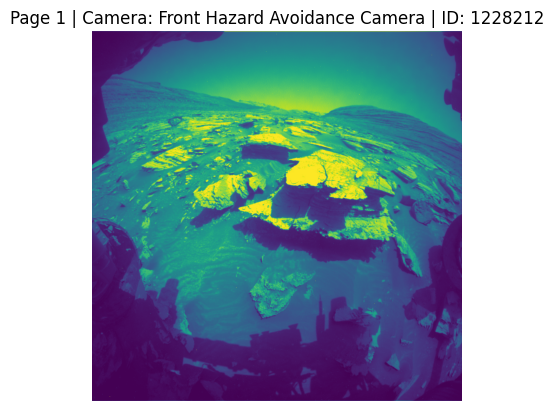

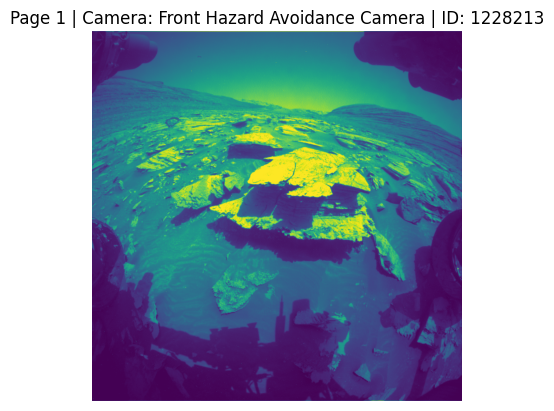

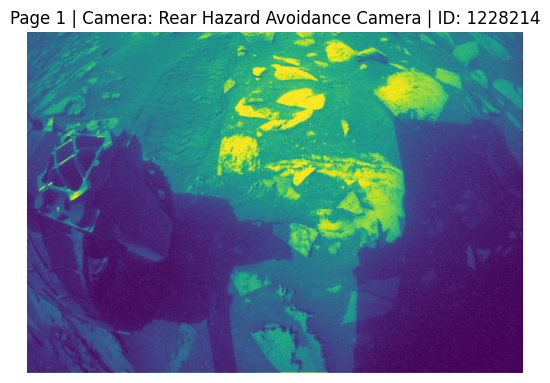

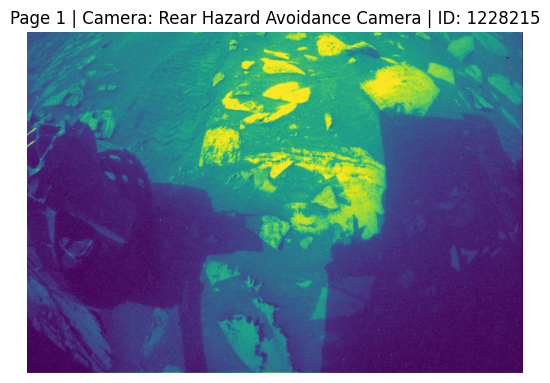

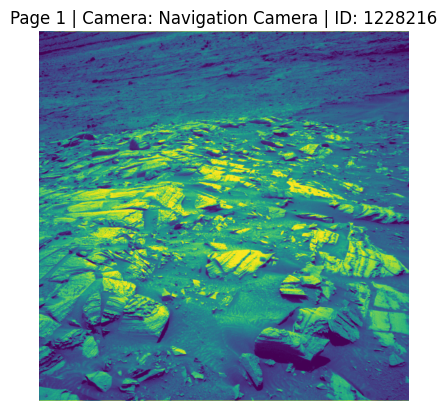

...

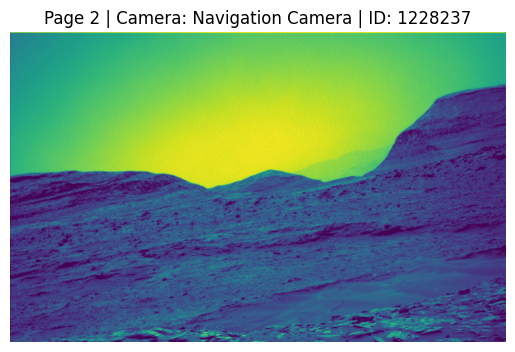

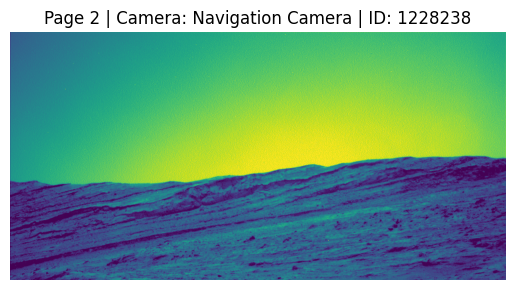

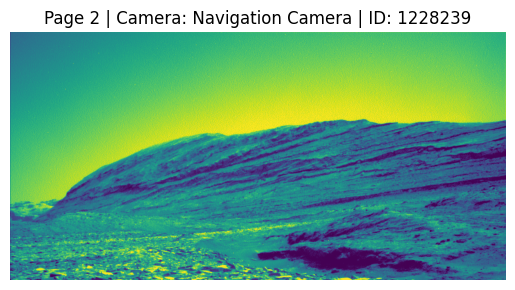

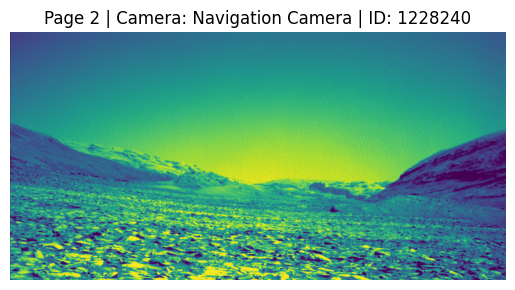

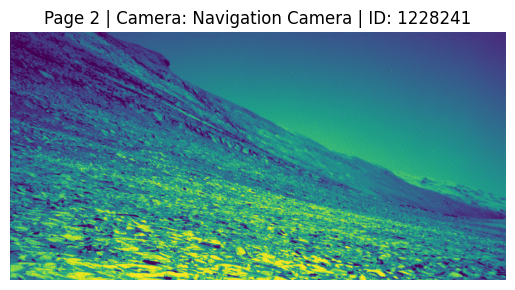

KeyboardInterrupt: 

In [5]:
import requests
import json
from skimage import io
import matplotlib.pyplot as plt

# Carregar a chave da API a partir do arquivo key.json
with open("key.json", "r") as f:
    data = json.load(f)
    api_key = data["API_KEY"]

# Configurações iniciais
url = "https://api.nasa.gov/mars-photos/api/v1/rovers/curiosity/photos"
sol = 4102
selected_cameras = ["NAVCAM", "FHAZ", "RHAZ"]  # Câmeras de interesse
page = 1  # Página inicial

# Laço para paginar resultados
while True:
    # Fazer a requisição GET com os parâmetros
    params = {"api_key": api_key, "sol": sol, "page": page}
    response = requests.get(url, params=params)
    
    # Verificar se a resposta foi bem-sucedida
    if response.status_code == 200:
        photos_data = response.json().get("photos", [])
        
        # Interromper o loop se não houver mais fotos
        if not photos_data:
            print("Nenhuma foto encontrada ou todas as páginas processadas.")
            break
        
        # Processar as fotos da página atual
        for photo in photos_data:
            camera_name = photo["camera"]["name"]
            if camera_name in selected_cameras:
                img_id = photo["id"]
                img_src = photo["img_src"]
                camera_full_name = photo["camera"]["full_name"]
                
                # Carregar e exibir a imagem
                img = io.imread(img_src)
                plt.imshow(img)
                plt.axis("off")
                plt.title(f"Page {page} | Camera: {camera_full_name} | ID: {img_id}")
                plt.show()
        
        # Incrementar a página
        page += 1
    else:
        print(f"Erro na requisição: {response.status_code}")
        break